In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [3]:
#load data
crash = pd.read_csv(
    '/Users/samuelclark/Documents/UMBC Data Science /Capstone/data/crashes/Crashes_in_DC.csv'
)

weather = pd.read_csv(
    '/Users/samuelclark/Documents/UMBC Data Science /Capstone/data/weather15_19.csv'
)


/Users/samuelclark/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (4,19) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
#fixing date time 
crash['DAY'] = pd.to_datetime(crash['REPORTDATE']).dt.day
crash['HOUR'] = pd.to_datetime(crash['REPORTDATE']).dt.hour
crash['MONTH'] = pd.to_datetime(crash['REPORTDATE']).dt.month
crash['YEAR'] = pd.to_datetime(crash['REPORTDATE']).dt.year
crash['WEEKDAY'] = pd.to_datetime(crash['REPORTDATE']).dt.dayofweek

#adding in an indicator for crash
crash['CrashCount'] = 1

crash['REPORTDATE'] = pd.to_datetime(crash['REPORTDATE']).dt.tz_convert(None)
crash['REPORTDATE'] = crash['REPORTDATE'].dt.strftime('%Y-%m-%d')
crash['REPORTDATE'] = pd.to_datetime(crash['REPORTDATE'])


weather['date_time'] = pd.to_datetime(weather['Date time'])


In [5]:
#Precipitaiton indicator
weather['Precipitation_indicator'] = np.where(weather['Precipitation'] != 0, 1, 0)

weather = weather.drop(columns = ['Precipitation'])


In [6]:
#merging the files on the date
df_final = pd.merge(crash, weather, how = 'inner', 
                  left_on = crash['REPORTDATE'],
                  right_on = weather['date_time'])

df_final = df_final.loc[(df_final['REPORTDATE'].dt.year > 2014) & (df_final['REPORTDATE'].dt.year < 2020)]

In [7]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129091 entries, 0 to 129090
Data columns (total 85 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   key_0                       129091 non-null  datetime64[ns]
 1   X                           129091 non-null  float64       
 2   Y                           129091 non-null  float64       
 3   OBJECTID                    129091 non-null  int64         
 4   CRIMEID                     129091 non-null  int64         
 5   CCN                         129091 non-null  object        
 6   REPORTDATE                  129091 non-null  datetime64[ns]
 7   ROUTEID                     129091 non-null  object        
 8   MEASURE                     129091 non-null  float64       
 9   OFFSET                      129091 non-null  float64       
 10  STREETSEGID                 113771 non-null  float64       
 11  ROADWAYSEGID                113771 non-

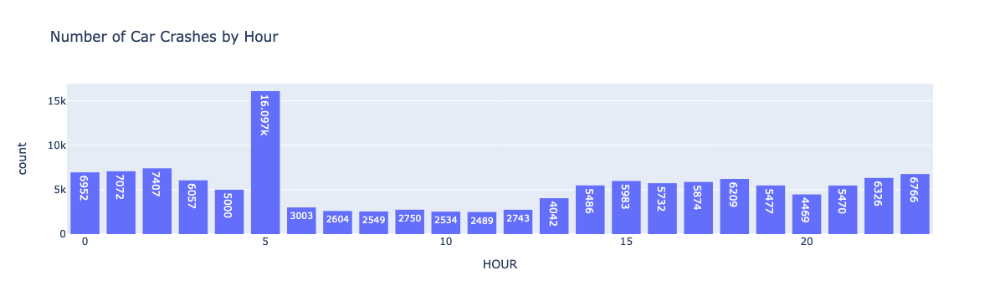

In [10]:
hoursData = df_final['HOUR']

fig = px.histogram(hoursData, x='HOUR', 
                   nbins=24,
                  title='Number of Car Crashes by Hour',
                  text_auto=True)
fig.update_layout(bargap=0.2)
fig.show()

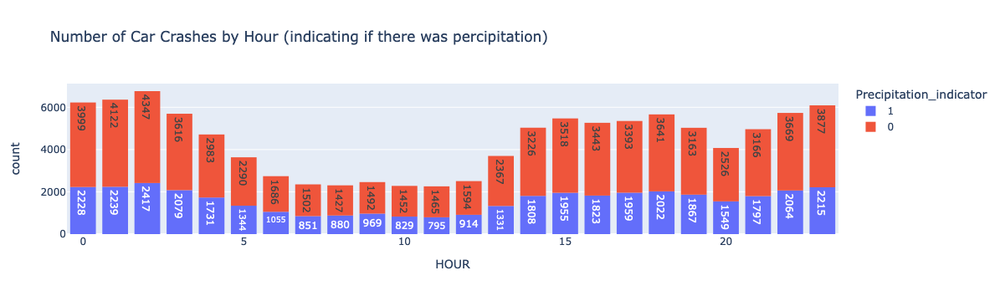

In [16]:
#df_final = df_final.loc[(df_final['YEAR'] > 2015) & (df_final['YEAR'] < 2022)]

Year_hour = df_final[['YEAR', 'HOUR', 'Precipitation_indicator', 'WEEKDAY']]

fig = px.histogram(Year_hour, x='HOUR', 
                   nbins=24,
                  title='Number of Car Crashes by Hour (indicating if there was percipitation)',
                  text_auto=True,
                  color = 'Precipitation_indicator')
fig.update_layout(bargap=0.2)
fig.show()

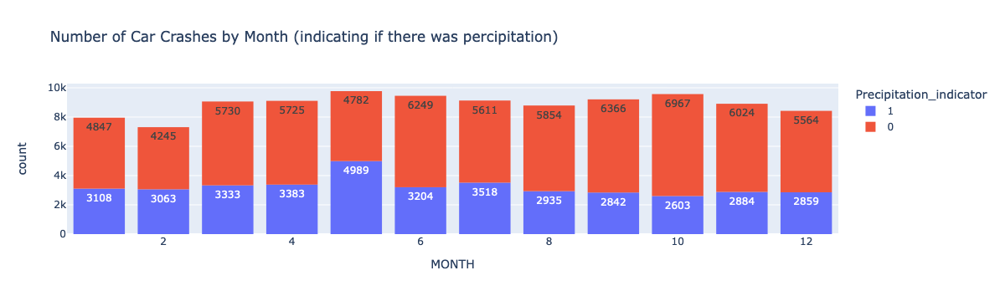

In [92]:
Year_hour = df_final[['YEAR', 'MONTH', 'HOUR', 'Precipitation_indicator', 'WEEKDAY']]
Year_hour = Year_hour.loc[(Year_hour['YEAR'] > 2015) & (Year_hour['YEAR'] < 2022)]

fig = px.histogram(Year_hour, x='MONTH', 
                   nbins=12,
                  title='Number of Car Crashes by Month (indicating if there was percipitation)',
                  text_auto=True,
                  color = 'Precipitation_indicator')
fig.update_layout(bargap=0.2)
fig.show()

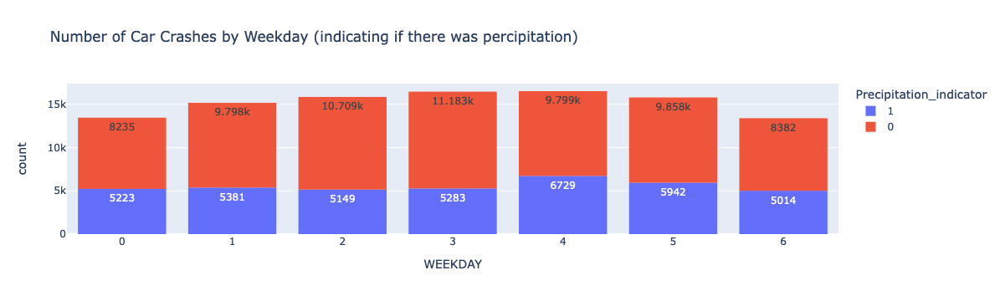

In [17]:
Year_hour = df_final[['YEAR', 'MONTH', 'HOUR', 'Precipitation_indicator', 'WEEKDAY']]
Year_hour = Year_hour.loc[(Year_hour['YEAR'] > 2015) & (Year_hour['YEAR'] < 2022)]

fig = px.histogram(Year_hour, x='WEEKDAY', 
                   nbins=12,
                  title='Number of Car Crashes by Weekday (indicating if there was percipitation)',
                  text_auto=True,
                  color = 'Precipitation_indicator')
fig.update_layout(bargap=0.2)
fig.show()

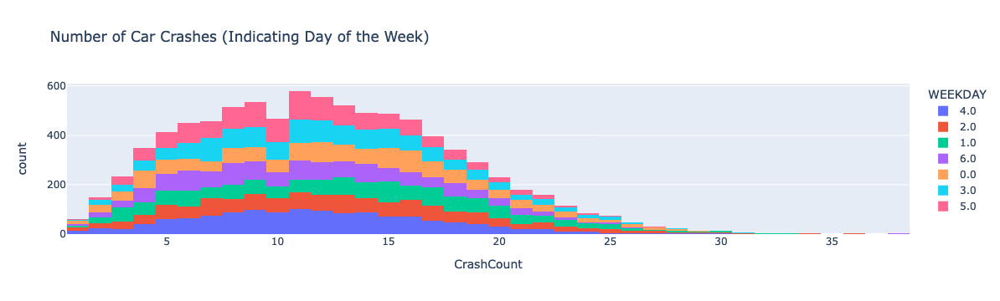

In [103]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum',
    'WEEKDAY':'first'
})



fig = px.histogram(crash_Group, 
                   title='Number of Car Crashes (Indicating Day of the Week)',
                   x="CrashCount", 
                   color = 'WEEKDAY')
fig.show()

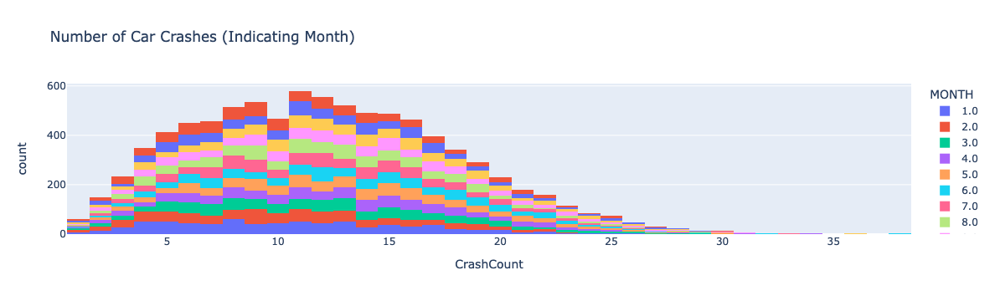

In [72]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum',
    'WEEKDAY':'first'
})
fig = px.histogram(crash_Group, 
                   title='Number of Car Crashes (Indicating Month)',
                   x="CrashCount", 
                   color = 'MONTH')
fig.show()

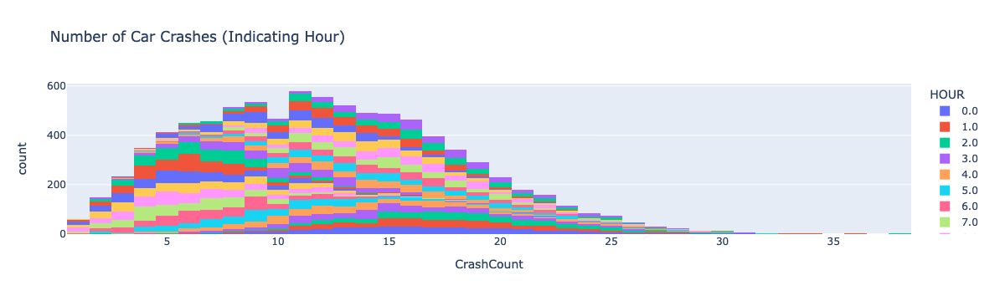

In [73]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum',
    'WEEKDAY':'first'
})
fig = px.histogram(crash_Group, 
                   title='Number of Car Crashes (Indicating Hour)',
                   x="CrashCount", 
                   color = 'HOUR')
fig.show()

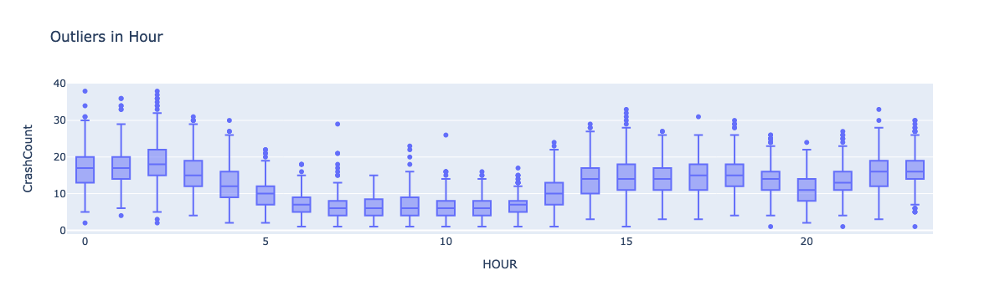

In [89]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum'
})

fig = px.box(crash_Group, 
             title = 'Outliers in Hour',
             x="HOUR", 
             y="CrashCount")
fig.show()

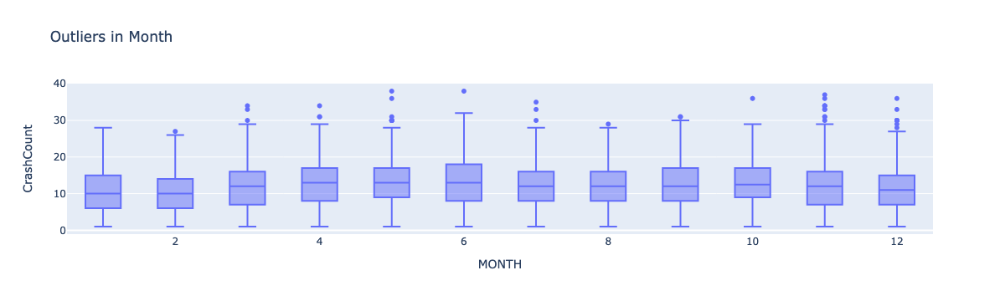

In [105]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum'
})

fig = px.box(crash_Group, 
             title = 'Outliers in Month',
             x="MONTH", 
             y="CrashCount")
fig.show()

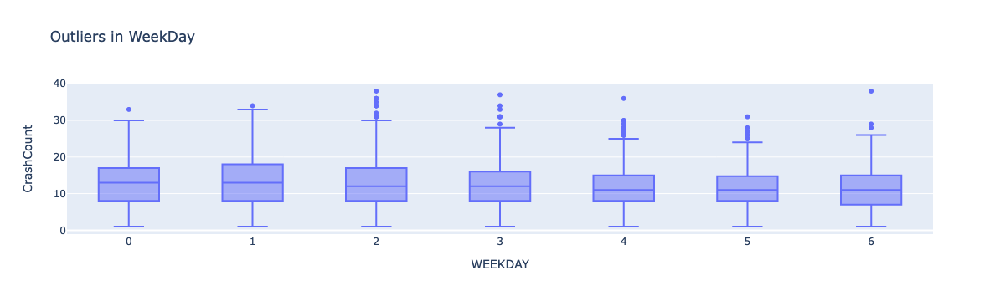

In [95]:
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum',
    'WEEKDAY':'first'
})

fig = px.box(crash_Group, 
             title = 'Outliers in WeekDay',
             x="WEEKDAY", 
             y="CrashCount")
fig.show()

Text(0.5, 1.0, 'Heatmap of Correlation Matrix')

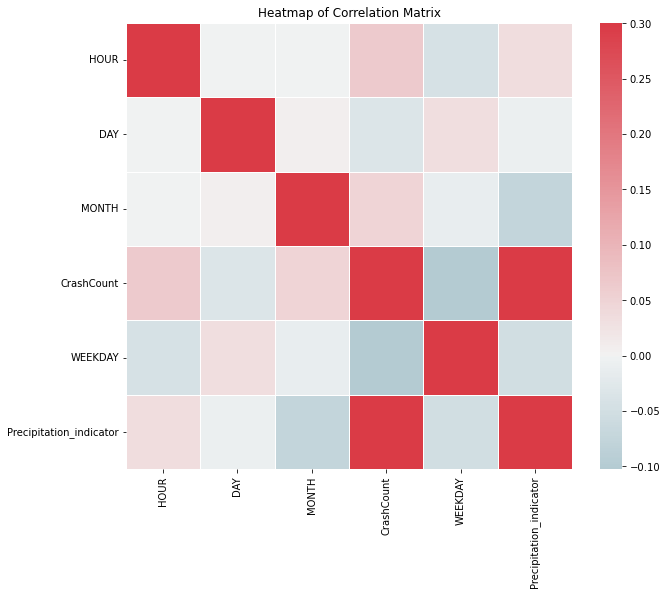

In [96]:
# Heatmap of features
crash_Group = df_final.groupby(['HOUR','DAY', 'MONTH'], as_index=False).agg(
{
    'CrashCount':'sum',
    'WEEKDAY':'first',
    'Precipitation_indicator':'sum'
})

corr = crash_Group.corr()
plt.figure(figsize = (10,10))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .82})
plt.title('Heatmap of Correlation Matrix')